# Problem Statement:
You have been given a task to analyze financial data of a fintech firm who are going to transition into an AI first strategy. You have a pivotal role in this transition, you must find all the necessary action points that will bring more efficiency in their transition.

# Objective:
Analyzing the financial data and devise multiple strategies such as forecasting, classification, regression, clustering for efficient and smooth transition.

Dataset Link - https://www.kaggle.com/datasets/fedesoriano/company-bankruptcy-prediction

# Import Libraries

In [1]:
import pandas as pd
import duckdb as db
import matplotlib.pyplot as plt
from scipy.stats import zscore
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
from imblearn.over_sampling import SMOTE


con = db.connect() #Connect to DuckDB

# Tasks to be Performed:
1. Preprocess and remove the noise from the data
2. Devise strategies that can be formed for the business problem
3. Feature engineer data according to the business requirements
4. Model and Evaluate various strategies that will be used to find actionable insights

# Read Source Data

In [2]:
data = pd.read_csv('data.csv')

data.tail()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
6814,0,0.493687,0.539468,0.543230,0.604455,0.604462,0.998992,0.797409,0.809331,0.303510,...,0.799927,0.000466,0.623620,0.604455,0.840359,0.279606,0.027064,0.566193,1,0.029890
6815,0,0.475162,0.538269,0.524172,0.598308,0.598308,0.998992,0.797414,0.809327,0.303520,...,0.799748,0.001959,0.623931,0.598306,0.840306,0.278132,0.027009,0.566018,1,0.038284
6816,0,0.472725,0.533744,0.520638,0.610444,0.610213,0.998984,0.797401,0.809317,0.303512,...,0.797778,0.002840,0.624156,0.610441,0.840138,0.275789,0.026791,0.565158,1,0.097649
6817,0,0.506264,0.559911,0.554045,0.607850,0.607850,0.999074,0.797500,0.809399,0.303498,...,0.811808,0.002837,0.623957,0.607846,0.841084,0.277547,0.026822,0.565302,1,0.044009
6818,0,0.493053,0.570105,0.549548,0.627409,0.627409,0.998080,0.801987,0.813800,0.313415,...,0.815956,0.000707,0.626680,0.627408,0.841019,0.275114,0.026793,0.565167,1,0.233902


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 96 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   Bankrupt?                                                 6819 non-null   int64  
 1    ROA(C) before interest and depreciation before interest  6819 non-null   float64
 2    ROA(A) before interest and % after tax                   6819 non-null   float64
 3    ROA(B) before interest and depreciation after tax        6819 non-null   float64
 4    Operating Gross Margin                                   6819 non-null   float64
 5    Realized Sales Gross Margin                              6819 non-null   float64
 6    Operating Profit Rate                                    6819 non-null   float64
 7    Pre-tax net Interest Rate                                6819 non-null   float64
 8    After-tax net Int

# Exploratory Data Analysis
1. The dataset has no null values

In [4]:
#double-check whether the null values are present
data.columns[data.isnull().any()]

Index([], dtype='object')

    Check for duplicate records

In [5]:
data.duplicated().sum()


0

    Shape of dataset:

In [6]:
print(f"Shape of the dataset: {data.shape}")


Shape of the dataset: (6819, 96)


    Statistical Summary

In [7]:
data.describe()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
count,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,...,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.0,6819.000000
mean,0.032263,0.505180,0.558625,0.553589,0.607948,0.607929,0.998755,0.797190,0.809084,0.303623,...,0.807760,1.862942e+07,0.623915,0.607946,0.840402,0.280365,0.027541,0.565358,1.0,0.047578
std,0.176710,0.060686,0.065620,0.061595,0.016934,0.016916,0.013010,0.012869,0.013601,0.011163,...,0.040332,3.764501e+08,0.012290,0.016934,0.014523,0.014463,0.015668,0.013214,0.0,0.050014
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,0.000000
25%,0.000000,0.476527,0.535543,0.527277,0.600445,0.600434,0.998969,0.797386,0.809312,0.303466,...,0.796750,9.036205e-04,0.623636,0.600443,0.840115,0.276944,0.026791,0.565158,1.0,0.024477
50%,0.000000,0.502706,0.559802,0.552278,0.605997,0.605976,0.999022,0.797464,0.809375,0.303525,...,0.810619,2.085213e-03,0.623879,0.605998,0.841179,0.278778,0.026808,0.565252,1.0,0.033798
75%,0.000000,0.535563,0.589157,0.584105,0.613914,0.613842,0.999095,0.797579,0.809469,0.303585,...,0.826455,5.269777e-03,0.624168,0.613913,0.842357,0.281449,0.026913,0.565725,1.0,0.052838
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,9.820000e+09,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0,1.000000


# Target Analysis
1. Based on the data ditribution of field "Brankrup?", the dataset is imbalanced.
2. When I tried to remove the outliers using IQR method (all the fields are not normally distributed), all records with target variable (Bankrupt?) value=0 are no longer available. We should go with other approach as the dataset is imbalanced.

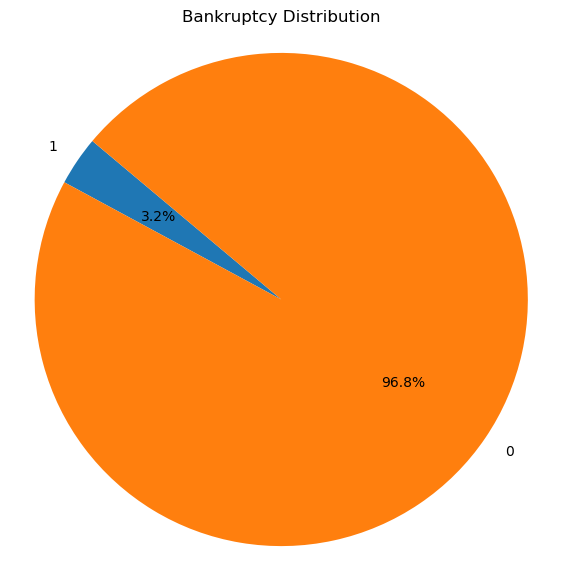

In [8]:
#target_column=db.sql('select *  from data ')
#target_column

target_df= con.execute('select "Bankrupt?" , count(*) as Bankrupt_Count  from data group by "Bankrupt?"').df()
target_df

# Create the pie chart
plt.figure(figsize=(7, 7))
plt.pie(target_df['Bankrupt_Count'], labels=target_df['Bankrupt?'], autopct='%1.1f%%', startangle=140)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title('Bankruptcy Distribution')
plt.show()

In [9]:
# def remove_outliers_iqr(df):
#     clean_df = df.copy()
#     for column in df.columns:  # Only numeric columns
#         Q1 = df[column].quantile(0.25)
#         Q3 = df[column].quantile(0.75)
#         IQR = Q3 - Q1
#         lower_bound = Q1 - 1.5 * IQR
#         upper_bound = Q3 + 1.5 * IQR
#         clean_df = clean_df[(clean_df[column] >= lower_bound) & (clean_df[column] <= upper_bound)] # Filter values within the bounds
#     return clean_df

# data_cleaned = remove_outliers_iqr(data) # Apply the function to remove outliers

# # Check the number of rows removed
# rows_removed = data.shape[0] - data_cleaned.shape[0]
# data_cleaned.shape, rows_removed


# Full-fledged correlation matrix

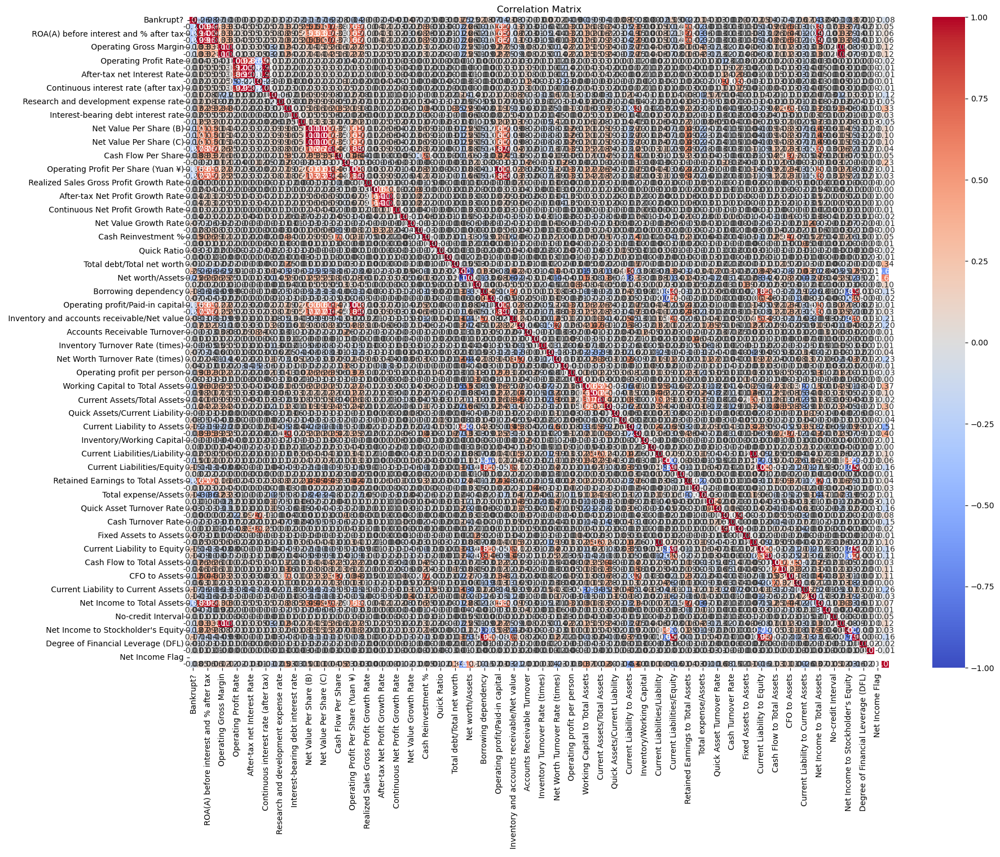

In [10]:
plt.figure(figsize=(20, 15))
corr = data.corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f', cbar=True) # Correlation heatmap
plt.title('Correlation Matrix')
plt.show()


# Building the mini-correlation matrix

In [18]:
# Set benchmark for features correlation significance (10%) with target

corr_features = corr["Bankrupt?"].abs() >= 0.10
corr_features.value_counts()
# Get list of names for features passing the benchmark 
feature_names = list(corr_features[corr_features].index)

feature_names

['Bankrupt?',
 ' ROA(C) before interest and depreciation before interest',
 ' ROA(A) before interest and % after tax',
 ' ROA(B) before interest and depreciation after tax',
 ' Operating Gross Margin',
 ' Tax rate (A)',
 ' Net Value Per Share (B)',
 ' Net Value Per Share (A)',
 ' Net Value Per Share (C)',
 ' Persistent EPS in the Last Four Seasons',
 ' Operating Profit Per Share (Yuan ¥)',
 ' Per Share Net profit before tax (Yuan ¥)',
 ' Debt ratio %',
 ' Net worth/Assets',
 ' Borrowing dependency',
 ' Operating profit/Paid-in capital',
 ' Net profit before tax/Paid-in capital',
 ' Working Capital to Total Assets',
 ' Cash/Total Assets',
 ' Current Liability to Assets',
 ' Working Capital/Equity',
 ' Current Liabilities/Equity',
 ' Retained Earnings to Total Assets',
 ' Total expense/Assets',
 ' Current Liability to Equity',
 ' Equity to Long-term Liability',
 ' CFO to Assets',
 ' Current Liability to Current Assets',
 ' Liability-Assets Flag',
 ' Net Income to Total Assets',
 ' Gross 

# Heatmap observing the significant correlation

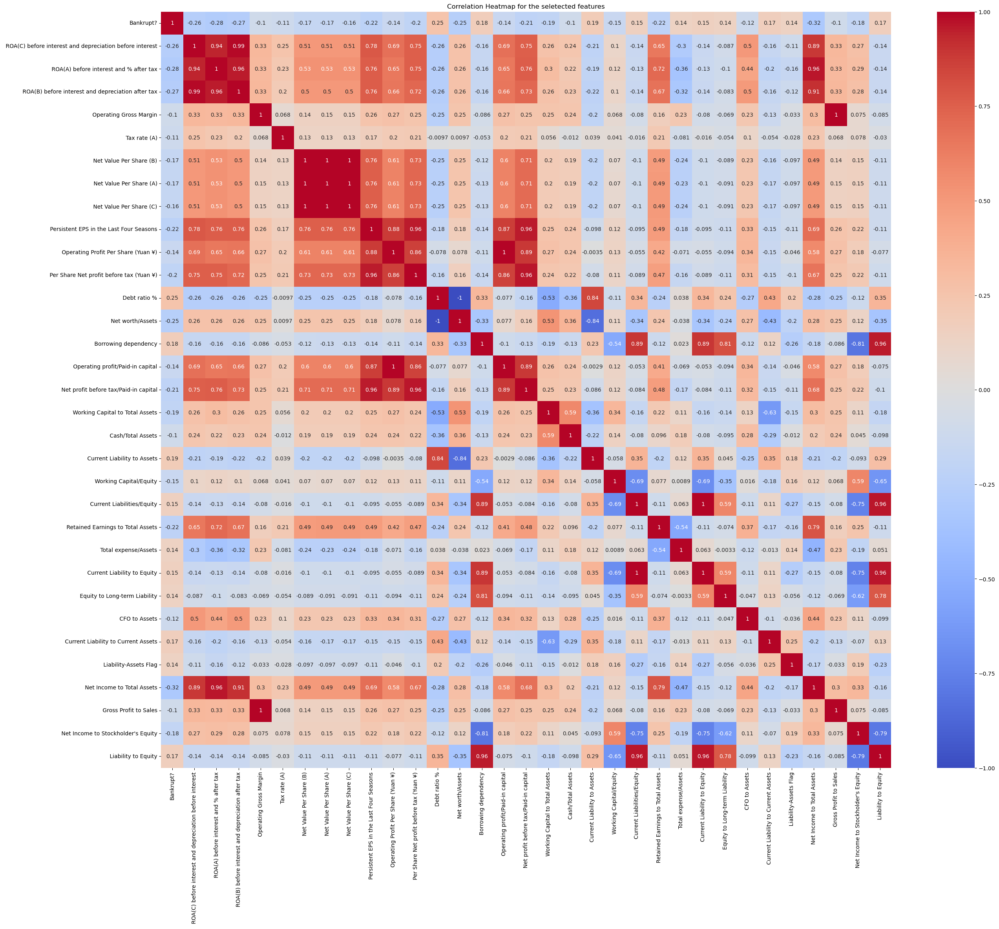

In [ ]:
# Create mini correlation matrix
mini_corr_matrix = data[feature_names].corr()
# Generate the heatmap
plt.figure(figsize=(30, 25))
sns.heatmap(mini_corr_matrix, annot = True, cmap="coolwarm")
plt.title("Correlation Heatmap for the seletected features")
plt.show()

# Pair-plot with important features

In [13]:
sns.pairplot(data[feature_names])
plt.show()

# Model with SMOTE due to imbalanced dataset

In [14]:

X = data[feature_names]  #Features
#X = data.drop('Bankrupt?',axis=1)  #Features
y = data['Bankrupt?'] #Target
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y) # Split the dataset into training and testing sets
# describes info about train and test set
print("Number transactions X_train dataset: ", X_train.shape)
print("Number transactions y_train dataset: ", y_train.shape)

smote = SMOTE(random_state=42) # Apply SMOTE to oversample the minority class in the training set
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# describes info about train SMOTE and test sets
print("---------------------------------------------------")
print("Number transactions X_train_smote dataset: ", X_train_smote.shape)
print("Number transactions y_train_smote dataset: ", y_train_smote.shape)
print("---------------------------------------------------")
print("Number transactions X_test dataset: ", X_test.shape)
print("Number transactions y_test dataset: ", y_test.shape)


# Train a classifier on the SMOTE-balanced dataset
model = RandomForestClassifier(n_estimators=100,random_state=42)
model.fit(X_train_smote, y_train_smote)



Number transactions X_train dataset:  (5455, 33)
Number transactions y_train dataset:  (5455,)
---------------------------------------------------
Number transactions X_train_smote dataset:  (10558, 33)
Number transactions y_train_smote dataset:  (10558,)
---------------------------------------------------
Number transactions X_test dataset:  (1364, 33)
Number transactions y_test dataset:  (1364,)


RandomForestClassifier(random_state=42)

# Feature Engineering: List of features in the order of importance

In [15]:
importances = model.feature_importances_
sorted(zip(X.columns, importances), key=lambda x: -x[1])

[('Bankrupt?', 0.4231746378713642),
 (' Borrowing dependency', 0.08503510265683918),
 (' Persistent EPS in the Last Four Seasons', 0.06513830080679475),
 (' Net worth/Assets', 0.0529624845731249),
 (' Liability to Equity', 0.048376931211996835),
 (' Debt ratio %', 0.03750257076608933),
 (' ROA(B) before interest and depreciation after tax', 0.030396088337924548),
 (' Retained Earnings to Total Assets', 0.02900882104355078),
 (' Net Income to Total Assets', 0.02802593049454556),
 (" Net Income to Stockholder's Equity", 0.02554450742362409),
 (' Net profit before tax/Paid-in capital', 0.02336668366630265),
 (' Per Share Net profit before tax (Yuan ¥)', 0.021329169929489956),
 (' ROA(C) before interest and depreciation before interest',
  0.016139667590367293),
 (' ROA(A) before interest and % after tax', 0.011989987912131798),
 (' Current Liability to Current Assets', 0.009830721684171978),
 (' Current Liability to Equity', 0.009596628354385933),
 (' Equity to Long-term Liability', 0.009

In [16]:
# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))

Confusion Matrix:
 [[1320    0]
 [   0   44]]

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1320
           1       1.00      1.00      1.00        44

    accuracy                           1.00      1364
   macro avg       1.00      1.00      1.00      1364
weighted avg       1.00      1.00      1.00      1364



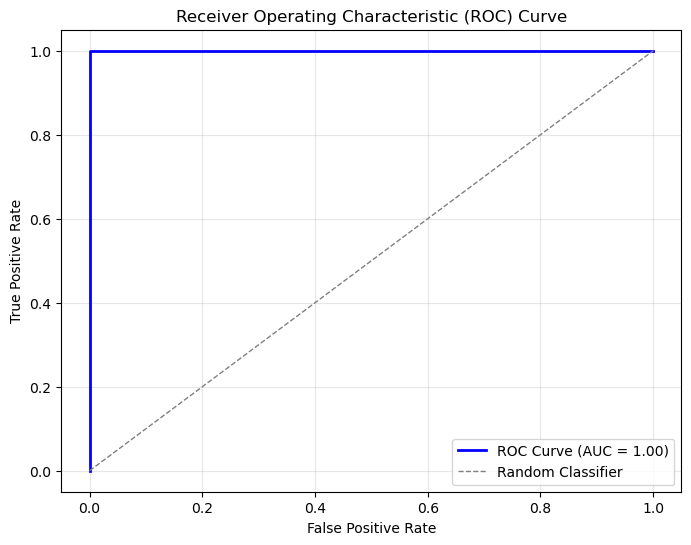

In [17]:
from sklearn.metrics import roc_curve, auc, RocCurveDisplay
# Predict probabilities for the positive class
y_pred_prob = model.predict_proba(X_test)[:, 1]

# Compute ROC curve and AUC score
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f"ROC Curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--', label="Random Classifier")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver Operating Characteristic (ROC) Curve")
plt.legend(loc="lower right")
plt.grid(alpha=0.3)
plt.show()